<a href="https://colab.research.google.com/github/johnnykoo84/DS-Unit-2-Applied-Modeling/blob/master/module3-permutation-boosting/Ilmo_Koo_LS_DS_233_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Lambda School Data Science

*Unit 2, Sprint 3, Module 3*

---


# Permutation & Boosting

You will use your portfolio project dataset for all assignments this sprint.

## Assignment

Complete these tasks for your project, and document your work.

- [ ] If you haven't completed assignment #1, please do so first.
- [ ] Continue to clean and explore your data. Make exploratory visualizations.
- [ ] Fit a model. Does it beat your baseline? 
- [ ] Try xgboost.
- [ ] Get your model's permutation importances.

You should try to complete an initial model today, because the rest of the week, we're making model interpretation visualizations.

But, if you aren't ready to try xgboost and permutation importances with your dataset today, that's okay. You can practice with another dataset instead. You may choose any dataset you've worked with previously.

The data subdirectory includes the Titanic dataset for classification and the NYC apartments dataset for regression. You may want to choose one of these datasets, because example solutions will be available for each.


## Reading

Top recommendations in _**bold italic:**_

#### Permutation Importances
- _**[Kaggle / Dan Becker: Machine Learning Explainability](https://www.kaggle.com/dansbecker/permutation-importance)**_
- [Christoph Molnar: Interpretable Machine Learning](https://christophm.github.io/interpretable-ml-book/feature-importance.html)

#### (Default) Feature Importances
  - [Ando Saabas: Selecting good features, Part 3, Random Forests](https://blog.datadive.net/selecting-good-features-part-iii-random-forests/)
  - [Terence Parr, et al: Beware Default Random Forest Importances](https://explained.ai/rf-importance/index.html)

#### Gradient Boosting
  - [A Gentle Introduction to the Gradient Boosting Algorithm for Machine Learning](https://machinelearningmastery.com/gentle-introduction-gradient-boosting-algorithm-machine-learning/)
  - [An Introduction to Statistical Learning](http://www-bcf.usc.edu/~gareth/ISL/ISLR%20Seventh%20Printing.pdf), Chapter 8
  - _**[Gradient Boosting Explained](https://www.gormanalysis.com/blog/gradient-boosting-explained/)**_ — Ben Gorman
  - [Gradient Boosting Explained](http://arogozhnikov.github.io/2016/06/24/gradient_boosting_explained.html) — Alex Rogozhnikov
  - [How to explain gradient boosting](https://explained.ai/gradient-boosting/) — Terence Parr & Jeremy Howard

In [3]:
# load the file
from google.colab import files
student_math_csv = files.upload()

Saving student-mat.csv to student-mat (1).csv


In [4]:
import pandas as pd
pd.options.display.max_columns = None
# df_por = pd.read_csv('./student-por.csv', sep=';')
df = pd.read_csv('./student-mat.csv', sep=';')
df.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10,10


Attributes for both student-mat.csv (Math course) and student-por.csv (Portuguese language course) datasets: 1 school - student's school (binary: 'GP' - Gabriel Pereira or 'MS' - Mousinho da Silveira)

2 sex - student's sex (binary: 'F' - female or 'M' - male)

3 age - student's age (numeric: from 15 to 22)

4 address - student's home address type (binary: 'U' - urban or 'R' - rural)

5 famsize - family size (binary: 'LE3' - less or equal to 3 or 'GT3' - greater than 3)

6 Pstatus - parent's cohabitation status (binary: 'T' - living together or 'A' - apart)

7 Medu - mother's education (numeric: 0 - none, 1 - primary education (4th grade), 2 â€“ 5th to 9th grade, 3 â€“ secondary education or 4 â€“ higher education)

8 Fedu - father's education (numeric: 0 - none, 1 - primary education (4th grade), 2 â€“ 5th to 9th grade, 3 â€“ secondary education or 4 â€“ higher education)

9 Mjob - mother's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')

10 Fjob - father's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')

11 reason - reason to choose this school (nominal: close to 'home', school 'reputation', 'course' preference or 'other')

12 guardian - student's guardian (nominal: 'mother', 'father' or 'other')

13 traveltime - home to school travel time (numeric: 1 - <15 min., 2 - 15 to 30 min., 3 - 30 min. to 1 hour, or 4 - >1 hour)

14 studytime - weekly study time (numeric: 1 - <2 hours, 2 - 2 to 5 hours, 3 - 5 to 10 hours, or 4 - >10 hours)

15 failures - number of past class failures (numeric: n if 1<=n<3, else 4)

16 schoolsup - extra educational support (binary: yes or no)

17 famsup - family educational support (binary: yes or no)

18 paid - extra paid classes within the course subject (Math or Portuguese) (binary: yes or no)

19 activities - extra-curricular activities (binary: yes or no)

20 nursery - attended nursery school (binary: yes or no)

21 higher - wants to take higher education (binary: yes or no)

22 internet - Internet access at home (binary: yes or no)

23 romantic - with a romantic relationship (binary: yes or no)

24 famrel - quality of family relationships (numeric: from 1 - very bad to 5 - excellent)

25 freetime - free time after school (numeric: from 1 - very low to 5 - very high)

26 goout - going out with friends (numeric: from 1 - very low to 5 - very high)

27 Dalc - workday alcohol consumption (numeric: from 1 - very low to 5 - very high)

28 Walc - weekend alcohol consumption (numeric: from 1 - very low to 5 - very high)

29 health - current health status (numeric: from 1 - very bad to 5 - very good)

30 absences - number of school absences (numeric: from 0 to 93)

these grades are related with the course subject, Math or Portuguese: 31 G1 - first period grade (numeric: from 0 to 20)

31 G2 - second period grade (numeric: from 0 to 20)

32 G3 - final grade (numeric: from 0 to 20, output target)

In [5]:
# Get Pandas Profiling Report
#installing package inside Google Colab
!pip install category_encoders==2.*
!pip install pandas-profiling==2.*

In [6]:
# Check Pandas Profiling version
import pandas_profiling
pandas_profiling.__version__

'2.6.0'

In [7]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df).to_notebook_iframe()

profile

In [8]:
# G1, G2 are highly corelated to G3 and it makes sense
# so I would like to drop G1 and G2 because there is no point if Grades are used to predict the final grade
# there will be situation where no G1 and G2 are given and predict G3 so.

df = df.drop(['G1', 'G2'],  axis=1)
df.shape

(395, 31)

In [0]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, train_size=0.80, test_size=0.20, random_state=42)

In [0]:
### The status_group column is the target
target = 'G3'

### Get a dataframe with all train columns except the target
train_features = train.drop(columns=[target])

### Get a list of the numeric features
numeric_features = train_features.select_dtypes(include='number').columns.tolist()

### Get a series with the cardinality of the nonnumeric features
cardinality = train_features.select_dtypes(exclude='number').nunique()

### Get a list of all categorical features with cardinality <= 50
categorical_features = cardinality[cardinality <= 50].index.tolist()

### Combine the lists 
features = numeric_features + categorical_features

In [0]:
### Arrange data into X features matrix and y target vector 
X_train = train[features]
y_train = train[target]
X_test = test[features]
y_test = test[target]

In [12]:
# let's get the baseline y prediction
import numpy as np
from sklearn.dummy import DummyRegressor
dummy_regr = DummyRegressor(strategy='mean')
dummy_regr.fit(X_train, y_train)
dummy_regr.predict(X_test)
dummy_regr.score(X_test, y_test)

-0.009709643515769084

In [13]:
# another way to guess the baseline
guess = y_train.mean()
errors = guess - y_test
mae = errors.abs().mean()
print(f'mean absolute error is: {mae:,.2f}')

mean absolute error is: 3.65


In [14]:
%%time
### WARNING: the %%time command sometimes has quirks/bugs

### TODO

import category_encoders as ce
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline

pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True), 
    SimpleImputer(strategy='median'), 
    RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42)
)

### Fit on train, score on val
pipeline.fit(X_train, y_train)
print('Validation Accuracy', pipeline.score(X_test, y_test))

Validation Accuracy 0.29539780733285403
CPU times: user 866 ms, sys: 170 ms, total: 1.04 s
Wall time: 1.1 s


In [15]:
# another way to see eval metrics
y_pred = pipeline.predict(X_test)
errors = y_pred - y_test
mae = errors.abs().mean()
print(f'new mae is: {mae:,.2f}')

new mae is: 3.00


In [0]:
# apply xgboost
from xgboost import XGBRegressor
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline

In [17]:
pipeline = make_pipeline(
    ce.ordinal.OrdinalEncoder(),
    XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1)
)

pipeline.fit(X_train, y_train)

[01:58:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['school', 'sex', 'address', 'famsize',
                                      'Pstatus', 'Mjob', 'Fjob', 'reason',
                                      'guardian', 'schoolsup', 'famsup', 'paid',
                                      'activities', 'nursery', 'higher',
                                      'internet', 'romantic'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='value',
                                mapping=[{'col': 'school',
                                          'data_type': dtype('O'),
                                          'mappi...
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, gamma=0,
                              importance_type='gain', learning_rate=0.1,
                              max_delta_step=0, max_depth=3

In [18]:
# Fit on train, score on test
pipeline.fit(X_train, y_train)
print('Test Accuracy', pipeline.score(X_test, y_test))

[01:58:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test Accuracy 0.24126133995597332


In [34]:
train.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G3
181,GP,M,16,U,GT3,T,3,3,services,other,home,mother,1,2,0,no,no,yes,yes,yes,yes,yes,yes,4,2,3,1,2,3,2,12
194,GP,M,16,U,GT3,T,2,3,other,other,home,father,2,1,0,no,no,no,no,yes,yes,yes,no,5,3,3,1,1,3,0,14
173,GP,F,16,U,GT3,T,1,3,at_home,services,home,mother,1,2,3,no,no,no,yes,no,yes,yes,yes,4,3,5,1,1,3,0,0
63,GP,F,16,U,GT3,T,4,3,teacher,health,home,mother,1,3,0,yes,yes,yes,yes,yes,yes,yes,no,3,4,4,2,4,4,2,9
253,GP,M,16,R,GT3,T,2,1,other,other,course,mother,2,1,0,no,no,no,yes,no,yes,no,no,3,3,2,1,3,3,0,8


## Avoid overfitting by early stopping with XGBoost

In [0]:
encoder = ce.ordinal.OrdinalEncoder()
X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

model = XGBRegressor(
    n_estimators=1000, # upper threshold
    max_depth=7,
    learning_rate=0.5, 
    n_jobs=-1,
    objective='multi:softmax',
    num_class=21
)

eval_set = [(X_train_encoded, y_train), 
            (X_test_encoded, y_test)]



In [34]:
len(np.unique(y_train))
len(np.unique(y_test))

16

In [38]:
model.fit(X_train_encoded, y_train,
          eval_set=eval_set,
          eval_metric='merror',
          early_stopping_rounds=50) # stop if the score hasn't improved for 50 rounds/iterations

[0]	validation_0-merror:0.572785	validation_1-merror:0.936709
Multiple eval metrics have been passed: 'validation_1-merror' will be used for early stopping.

Will train until validation_1-merror hasn't improved in 50 rounds.
[1]	validation_0-merror:0.382911	validation_1-merror:0.848101
[2]	validation_0-merror:0.21519	validation_1-merror:0.848101
[3]	validation_0-merror:0.101266	validation_1-merror:0.860759
[4]	validation_0-merror:0.050633	validation_1-merror:0.848101
[5]	validation_0-merror:0.037975	validation_1-merror:0.822785
[6]	validation_0-merror:0.015823	validation_1-merror:0.848101
[7]	validation_0-merror:0.009494	validation_1-merror:0.835443
[8]	validation_0-merror:0.006329	validation_1-merror:0.835443
[9]	validation_0-merror:0.003165	validation_1-merror:0.810127
[10]	validation_0-merror:0.003165	validation_1-merror:0.822785
[11]	validation_0-merror:0	validation_1-merror:0.78481
[12]	validation_0-merror:0	validation_1-merror:0.797468
[13]	validation_0-merror:0	validation_1-merr

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.5, max_delta_step=0,
             max_depth=7, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=-1, nthread=None, num_class=21, objective='multi:softmax',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

Stopping. Best iteration:

[11]	validation_0-merror:0	validation_1-merror:0.78481

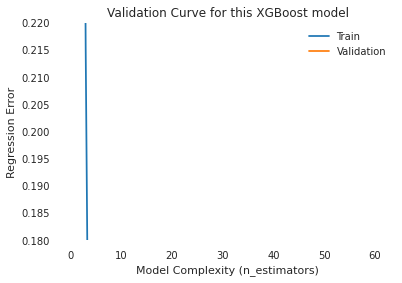

In [46]:
import matplotlib.pyplot as plt
results = model.evals_result()
train_error = results['validation_0']['merror']
val_error = results['validation_1']['merror']
epoch = list(range(1, len(train_error)+1))
plt.plot(epoch, train_error, label='Train')
plt.plot(epoch, val_error, label='Validation')
plt.ylabel('Regression Error')
plt.xlabel('Model Complexity (n_estimators)')
plt.title('Validation Curve for this XGBoost model')
plt.ylim((0.18, 0.22)) # Zoom in
plt.legend();

In [49]:
model.predict(X_test_encoded)

array([10., 10., 12., 14.,  8.,  0., 16., 11.,  0., 11., 15., 16., 12.,
       13., 10.,  8.,  0., 11., 19.,  0., 14.,  8.,  0., 10., 11., 13.,
       10., 15., 15., 15.,  8., 16., 14., 11., 10., 13.,  0.,  9., 12.,
        5.,  7.,  9., 14., 11., 11., 14.,  9., 11., 11., 11.,  6., 15.,
       12., 10., 10., 13., 12.,  0., 16., 15., 15., 11., 10., 10., 11.,
       12., 12., 16., 11., 10., 11.,  6., 10., 18., 12., 11., 16., 11.,
       12.], dtype=float32)

In [50]:
model.score(X_test_encoded, y_test)

-0.017347544775419443

In [0]:
pipeline = make_pipeline(
    ce.ordinal.OrdinalEncoder(),
    XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1)
)

pipeline.fit(X_train, y_train)